# Домашнее задание по машинному обучению на 24.11.25

## Выполнил Прокофьев Кирилл 3825М1ФИ1



### Информация о датасете:

Датасет содержит 30 000 записей и 20 характеристик, связанных с состоянием здоровья людей, а также некоторые столбцы с шумом/случайными данными, которые будут удалены за ненадобностью.

#### Признаки (всего 18): 

* Age: Patient’s age (in years).

* Gender: Male / Female.

* Medical Condition: Reported health condition (e.g., Diabetes, Hypertension, Asthma, Obesity, Healthy).

* Glucose: Blood glucose level.

* Blood Pressure: Blood pressure measurement.

* BMI: Body Mass Index.

* Oxygen Saturation: Blood oxygen saturation level.

* LengthOfStay: Hospital length of stay (days).

* Cholesterol: Cholesterol level.

* Triglycerides: Triglyceride level.

* HbA1c: Hemoglobin A1c (glycated hemoglobin).

* Smoking: Smoking status (0 = Non-smoker, 1 = Smoker).

* Alcohol: Alcohol consumption (0 = No, 1 = Yes).

* Physical Activity: Physical activity (approx. hours/week).

* Diet Score: Diet quality score (numeric).

* Family History: Family medical history (0 = No, 1 = Yes).

* Stress Level: Stress level (numeric scale).

* Sleep Hours: Average sleep hours per day.


### Постановка задачи:

Решается задача ранней диагностики (бинарная класификация) сахарного диабета на основе синтетического медицинского датасета, содержащего клинические и анамнестические данные 30000 пациентов.

### Импорт необходимых библиотек:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn as skl
import seaborn as sns
import missingno as msno



### Подготовка датасета к работе:

#### Подключение датасета:

In [2]:
#Загрузка датасета
df = pd.read_csv('dirty_v3_path.csv')

df.head()
df.info()
df.describe() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                25500 non-null  float64
 1   Gender             25500 non-null  object 
 2   Medical Condition  25500 non-null  object 
 3   Glucose            25500 non-null  float64
 4   Blood Pressure     25500 non-null  float64
 5   BMI                30000 non-null  float64
 6   Oxygen Saturation  30000 non-null  float64
 7   LengthOfStay       30000 non-null  int64  
 8   Cholesterol        30000 non-null  float64
 9   Triglycerides      30000 non-null  float64
 10  HbA1c              30000 non-null  float64
 11  Smoking            30000 non-null  int64  
 12  Alcohol            30000 non-null  int64  
 13  Physical Activity  30000 non-null  float64
 14  Diet Score         30000 non-null  float64
 15  Family History     30000 non-null  int64  
 16  Stress Level       300

,Age,Glucose,Blood Pressure,BMI,Oxygen Saturation,LengthOfStay,Cholesterol,Triglycerides,HbA1c,Smoking,Alcohol,Physical Activity,Diet Score,Family History,Stress Level,Sleep Hours,noise_col
count,25500.000000,25500.000000,25500.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,54.616784,123.622179,140.455337,28.476155,94.954992,4.414133,213.033891,176.837375,6.294377,0.279767,0.238533,3.803214,4.029654,0.439433,5.917312,6.229836,-0.517010
std,15.973618,41.576943,21.077933,5.728804,3.736202,2.761536,33.519757,48.812827,1.320269,0.448892,0.426194,2.011729,1.817165,0.496326,2.225057,1.187669,100.076959
min,10.000000,20.320000,74.240000,7.670000,67.510000,1.000000,95.730000,-22.480000,3.280000,0.000000,0.000000,-3.680000,-1.750000,0.000000,-2.440000,1.590000,-412.169596
25%,45.000000,96.280000,125.140000,24.590000,93.000000,3.000000,189.500000,141.280000,5.330000,0.000000,0.000000,2.350000,2.770000,0.000000,4.370000,5.410000,-68.270749
50%,55.000000,110.500000,138.320000,28.050000,95.300000,4.000000,211.835000,173.365000,5.970000,0.000000,0.000000,3.590000,3.790000,0.000000,5.900000,6.230000,-0.510742
75%,66.000000,136.610000,153.790000,31.810000,97.380000,5.000000,235.310000,208.630000,6.920000,1.000000,0.000000,5.060000,5.020000,1.000000,7.440000,7.050000,66.811399
max,89.000000,318.510000,226.380000,56.850000,110.070000,19.000000,358.370000,421.510000,12.360000,1.000000,1.000000,12.410000,12.060000,1.000000,15.450000,10.350000,467.894910


#### Удаление "мусорных признаков":

In [3]:
df.drop('random_notes', axis=1,inplace=True)
df.drop('noise_col', axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                25500 non-null  float64
 1   Gender             25500 non-null  object 
 2   Medical Condition  25500 non-null  object 
 3   Glucose            25500 non-null  float64
 4   Blood Pressure     25500 non-null  float64
 5   BMI                30000 non-null  float64
 6   Oxygen Saturation  30000 non-null  float64
 7   LengthOfStay       30000 non-null  int64  
 8   Cholesterol        30000 non-null  float64
 9   Triglycerides      30000 non-null  float64
 10  HbA1c              30000 non-null  float64
 11  Smoking            30000 non-null  int64  
 12  Alcohol            30000 non-null  int64  
 13  Physical Activity  30000 non-null  float64
 14  Diet Score         30000 non-null  float64
 15  Family History     30000 non-null  int64  
 16  Stress Level       300

### Исправление серьёзных аномалий в четырех признаках

Поскольку данные синтетические и используются в учебных целях, я могу себе позволить замену пропущенных или аномальных значений признаков медианой, модой или другими значениями.

Признак Triglycerides:

В медицине уровень триглицеридов не может быть отрицательным. Минимальное значение в статистике -22.48 — это явно ошибка.

* Решение: замена всех отрицательных значений медианой.

Physical Activity:
Отрицательные значения (-3.68) не имеют физического смысла (физическая активность измеряется в часах/неделю).

* Решение: замена всех отрицательных значений медианой.

Stress Level:
Отрицательные значения (-2.44) невозможны для шкалы стресса (обычно 0+).

* Решение: замена всех отрицательных значений медианой.

Diet Score:
Отрицательные значения (-1.75) могут быть допустимы, если это относительная шкала (например, отклонение от нормы). Но в медицинских данных обычно используют неотрицательные шкалы.

* Решение: замена всех отрицательных значений медианой.

Для медицинских данных медиана предпочтительнее, так как устойчива к выбросам. В столбце Triglycerides есть экстремальные значения (макс 421.51), что искажает среднее.



In [4]:
print("АНАЛИЗ АНОМАЛИЙ ДО ИСПРАВЛЕНИЯ:")
problematic_cols = {
    "Triglycerides": {"min_valid": 0, "max_valid": 500},
    "Physical Activity": {"min_valid": 0, "max_valid": 20},
    "Stress Level": {"min_valid": 0, "max_valid": 20},
    "Diet Score": {"min_valid": 0, "max_valid": 13}
}

# Словарь для хранения количества аномалий
anomaly_counts = {}

for col, limits in problematic_cols.items():
    min_val = limits["min_valid"]
    max_val = limits["max_valid"]
    
    # Считаем аномалии ДО исправления
    mask_anomaly = (df[col] < min_val) | (df[col] > max_val)
    anomaly_count = mask_anomaly.sum()
    anomaly_counts[col] = anomaly_count
    
    print(f"{col}: {anomaly_count} аномальных значений (диапазон: {min_val}-{max_val})")

# 3. ИСПРАВЛЕНИЕ АНОМАЛИЙ (правильный порядок)
print("\nИСПРАВЛЕНИЕ АНОМАЛИЙ:")
for col, limits in problematic_cols.items():
    min_val = limits["min_valid"]
    max_val = limits["max_valid"]
    
    # Шаг 1: Считаем аномалии (уже сделано выше, используем anomaly_counts)
    fixed_count = anomaly_counts[col]
    
    # Шаг 2: Заменяем аномалии на NaN
    mask_anomaly = (df[col] < min_val) | (df[col] > max_val)
    df.loc[mask_anomaly, col] = np.nan
    
    # Шаг 3: Считаем медиану ТОЛЬКО по валидным данным
    valid_data = df[
        (df[col] >= min_val) & 
        (df[col] <= max_val) & 
        (df[col].notnull())
    ][col]
    
    if len(valid_data) > 0:
        valid_median = valid_data.median()
        # Шаг 4: Заполняем NaN медианой
        df[col] = df[col].fillna(valid_median)
        print(f"{col}: исправлено {fixed_count} значений. Медиана валидных данных = {valid_median:.2f}")
    else:
        print(f" {col}: Нет валидных данных для расчёта медианы!")

# 4. ДОПОЛНИТЕЛЬНОЕ ИСПРАВЛЕНИЕ -0.00
for col in ["Physical Activity", "Stress Level", "Diet Score", "Triglycerides"]:
    # Заменяем -0.0 на 0.0
    df[col] = df[col].apply(lambda x: 0.0 if abs(x) < 1e-10 else x)

# 5. ФИНАЛЬНАЯ ПРОВЕРКА
print("\n ФИНАЛЬНЫЕ СТАТИСТИКИ ПОСЛЕ ИСПРАВЛЕНИЙ:")
print("\nМинимальные значения:")
print(df[list(problematic_cols.keys())].min())

print("\nМаксимальные значения:")
print(df[list(problematic_cols.keys())].max())

print("\nПроверка отрицательных значений:")
for col in problematic_cols.keys():
    neg_count = (df[col] < 0).sum()
    print(f"{col}: {neg_count} отрицательных значений осталось")

АНАЛИЗ АНОМАЛИЙ ДО ИСПРАВЛЕНИЯ:
Triglycerides: 4 аномальных значений (диапазон: 0-500)
Physical Activity: 302 аномальных значений (диапазон: 0-20)
Stress Level: 67 аномальных значений (диапазон: 0-20)
Diet Score: 105 аномальных значений (диапазон: 0-13)

ИСПРАВЛЕНИЕ АНОМАЛИЙ:
Triglycerides: исправлено 4 значений. Медиана валидных данных = 173.38
Physical Activity: исправлено 302 значений. Медиана валидных данных = 3.61
Stress Level: исправлено 67 значений. Медиана валидных данных = 5.90
Diet Score: исправлено 105 значений. Медиана валидных данных = 3.80

 ФИНАЛЬНЫЕ СТАТИСТИКИ ПОСЛЕ ИСПРАВЛЕНИЙ:

Минимальные значения:
Triglycerides        1.14
Physical Activity    0.00
Stress Level         0.00
Diet Score           0.00
dtype: float64

Максимальные значения:
Triglycerides        421.51
Physical Activity     12.41
Stress Level          15.45
Diet Score            12.06
dtype: float64

Проверка отрицательных значений:
Triglycerides: 0 отрицательных значений осталось
Physical Activity: 0 о

#### Подсчет пропущенных значений:

Размер данных: (30000, 18)
Строк с пропусками: 16645 из 30 000

Абсолютное количество пропусков по столбцам:
Age                  4500
Gender               4500
Medical Condition    4500
Glucose              4500
Blood Pressure       4500
BMI                     0
Oxygen Saturation       0
LengthOfStay            0
Cholesterol             0
Triglycerides           0
dtype: int64
Доля пропусков по столбцаv
Age                  0.15
Gender               0.15
Medical Condition    0.15
Glucose              0.15
Blood Pressure       0.15
BMI                  0.00
Oxygen Saturation    0.00
LengthOfStay         0.00
Cholesterol          0.00
Triglycerides        0.00
HbA1c                0.00
Smoking              0.00
Alcohol              0.00
Physical Activity    0.00
Diet Score           0.00
Family History       0.00
Stress Level         0.00
Sleep Hours          0.00
dtype: float64
Доля строк с пропусками: 0.5548333333333333


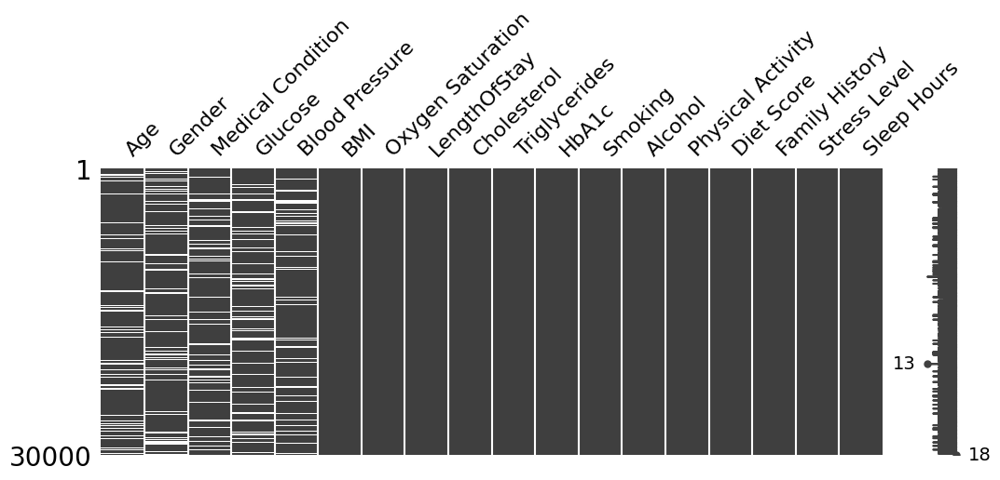

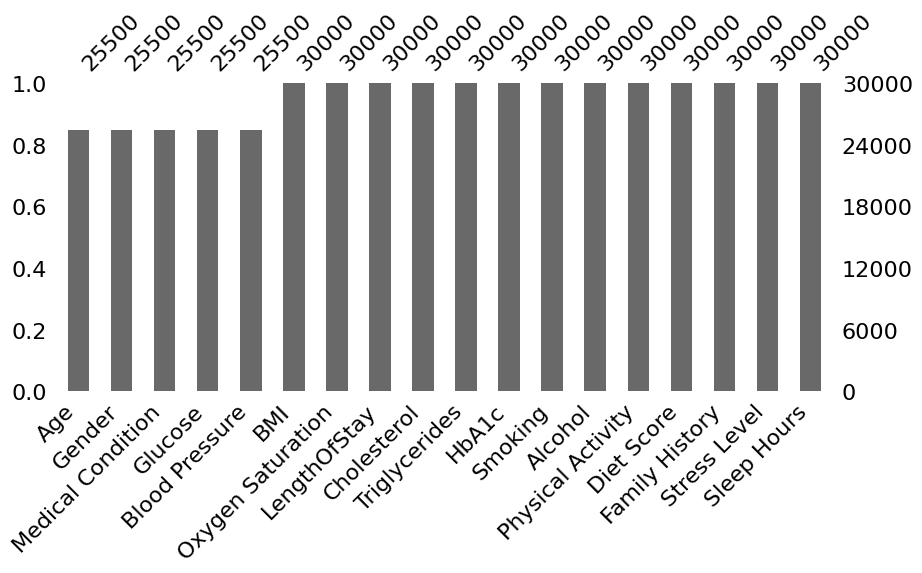

In [5]:
# 1. Текущее количество строк и столбцов
print("Размер данных:", df.shape)

# 1. Сколько строк имеют хотя бы один пропуск?
rows_with_missing = df.isnull().any(axis=1).sum()
print(f"Строк с пропусками: {rows_with_missing} из 30 000")

# 2. Реальная доля пропусков по столбцам (абсолютные числа)
print("\nАбсолютное количество пропусков по столбцам:")
print(df.isnull().sum().sort_values(ascending=False).head(10))


# 3) доля пропусков по столбцам
missing_per_col = df.isnull().mean().sort_values(ascending=False)
print("Доля пропусков по столбцаv")
print(missing_per_col.head(20))

# 4) доля строк с хотя бы одним пропуском
rows_with_missing = (df.isnull().any(axis=1)).mean()
print("Доля строк с пропусками:", rows_with_missing)

# 5) визуализация: matrix + bar
msno.matrix(df, figsize=(12,4))
plt.show()
msno.bar(df, figsize=(10,4))
plt.show()
pass


На графиках мы видим что пропуски есть только у признаков: Age,Gender,Glucose,Blood Pressure,Medical Condition

Всего строк с пропусками: 16645 из 30 000 это больше половины всех наблюдений. 

Удаление этих строк сократит датасет почти на 56% что недопустимо.

Мое решение проблемы c пропущенными значениями:

* Удалить все строки с пропущенными значениями у целевой переменной "Medical Condition" (4500 строк или 15% от всех строк в датасете)
* Дозаполнить пропущенные значения остальных признаков с помощью IterativeImputer.

Таким образом я смогу сохранить большую часть данных в датасете для дальнейшего решения задачи.

#### Удаление строк с пропущенными значениями у признака Medical Condition:

Столько строк осталось : 25500
Строк с пропусками: 12145 из 30 000

Абсолютное количество пропусков по столбцам:
Age                  3821
Blood Pressure       3800
Gender               3794
Glucose              3788
Medical Condition       0
BMI                     0
Oxygen Saturation       0
LengthOfStay            0
Cholesterol             0
Triglycerides           0
dtype: int64
Доля пропусков по столбца
Age                  0.149843
Blood Pressure       0.149020
Gender               0.148784
Glucose              0.148549
Medical Condition    0.000000
BMI                  0.000000
Oxygen Saturation    0.000000
LengthOfStay         0.000000
Cholesterol          0.000000
Triglycerides        0.000000
HbA1c                0.000000
Smoking              0.000000
Alcohol              0.000000
Physical Activity    0.000000
Diet Score           0.000000
Family History       0.000000
Stress Level         0.000000
Sleep Hours          0.000000
dtype: float64
Доля строк с пропусками: 0.476274

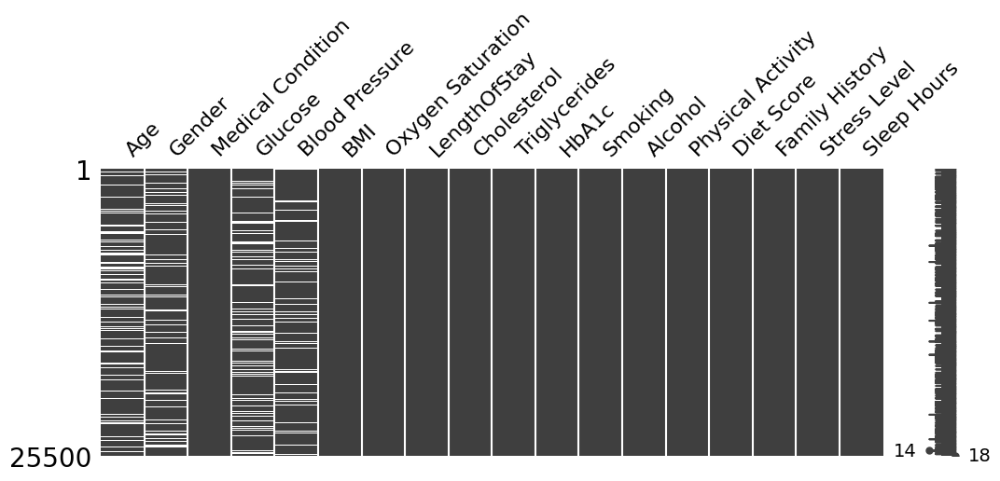

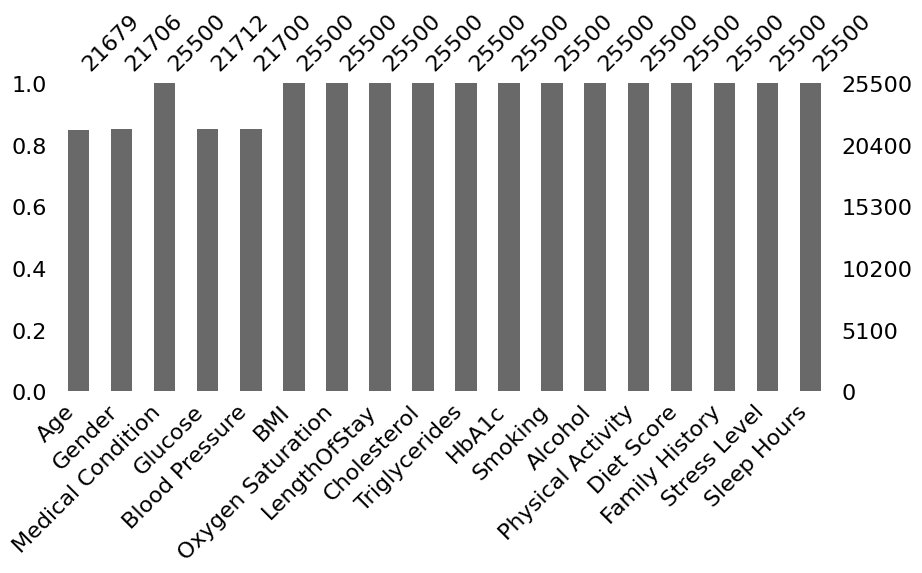

In [6]:
df = df.dropna(subset=["Medical Condition"])
print(f'Столько строк осталось : {len(df)}')

# 1. Сколько строк имеют хотя бы один пропуск?
rows_with_missing = df.isnull().any(axis=1).sum()
print(f"Строк с пропусками: {rows_with_missing} из 30 000")

# 2. Реальная доля пропусков по столбцам (абсолютные числа)
print("\nАбсолютное количество пропусков по столбцам:")
print(df.isnull().sum().sort_values(ascending=False).head(10))

# 3) доля пропусков по столбцам
missing_per_col = df.isnull().mean().sort_values(ascending=False)
print("Доля пропусков по столбца")
print(missing_per_col.head(20))

# 4) доля строк с хотя бы одним пропуском
rows_with_missing = (df.isnull().any(axis=1)).mean()
print("Доля строк с пропусками:", rows_with_missing)

# 5) визуализация: matrix + bar
msno.matrix(df, figsize=(12,4))
plt.show()
msno.bar(df, figsize=(10,4))
plt.show()
pass




Осталось еще 12145 строк с пропусками у признаков Age,Gender,Glucose,Blood Pressure их мы дозаполним с помощью IterativeImputer.

#### Идея IterativeImputer:

MICE (Multivariate Imputation by Chained Equations)

Это итеративный алгоритм, который рассматривает каждый столбец с пропусками как целевую переменную и обучает отдельную модель (в моем случае это  Random Forest) для его предсказания на основе других столбцов.

**Инициализация:**  
Все пропуски заполняются медианой (`initial_strategy="median"`).  
Пример для `Age`: 4500 пропусков заменяются на 54 (медиана по столбцу).

**Итерации (`max_iter=10`):**  
Для каждого столбца из `impute_cols` (в порядке возрастания количества пропусков):  
-  Временно "замаскировать" 10% известных значений (для контроля качества).  
-  Обучить модель на заполненных данных.  
-  Предсказать пропущенные значения и ранее замаскированные.  
-  Обновить значения в столбце.  
Повторить для всех столбцов.

**Сходимость:**  
Алгоритм останавливается, когда изменения между итерациями < 0.001, или достигнуто `max_iter=10`.




### Почему выбран именно RandomForestRegressor?

1. Random Forest хорошо обрабатывает нелинейные связи.

2. Устойчив к выбросам.

3. Автоматически отбирает признаки.

4. Имеет приемлемую скорость работы.

5. Имеет высокую точность для смешанных данных

In [7]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

# Создаем новый чистый датасет (копия df ) для удобства
df_clean = df.copy()

# 1. Временное кодирование Gender (только для импутации)
df_clean["Gender_encoded"] = df_clean["Gender"].fillna("MISSING")
gender_encoder = {val: idx for idx, val in enumerate(df_clean["Gender_encoded"].unique())}
df_clean["Gender_encoded"] = df_clean["Gender_encoded"].map(gender_encoder)

# 2. Ключевое изменение: Используем ВСЕ числовые столбцы для импутации!
# Столбцы ДЛЯ ЗАПОЛНЕНИЯ (пропуски есть только здесь)
impute_cols = ["Age", "Glucose", "Blood Pressure", "Gender_encoded"]

# Столбцы-признаки ДЛЯ ОБУЧЕНИЯ (все числовые столбцы, КРОМЕ целевой переменной)
feature_cols = [
    "Age", "Glucose", "Blood Pressure", "Gender_encoded",  # Целевые для импутации
    "BMI", "Oxygen Saturation", "LengthOfStay", "Cholesterol", 
    "Triglycerides", "HbA1c", "Smoking", "Alcohol", "Physical Activity", 
    "Diet Score", "Family History", "Stress Level", "Sleep Hours"
    # ВАЖНО: Medical Condition НЕ включаем!
]

# 3. Проверка наличия всех столбцов
missing_features = [col for col in feature_cols if col not in df_clean.columns]
if missing_features:
    raise ValueError(f"Отсутствуют столбцы для обучения: {missing_features}")

# 4. Настройка imputer с использованием ВСЕХ признаков
imputer = IterativeImputer(
    estimator=RandomForestRegressor(
        n_estimators=50,
        max_depth=10,
        random_state=42,
        n_jobs=-1
    ),
    max_iter=10,
    random_state=42,
    verbose=1,
    # Ключевой параметр: какие столбцы импутировать (не все!)
    initial_strategy="median"  # Стабильнее для смешанных данных
)



# 6. Выполняем импутацию ТОЛЬКО для impute_cols, используя ВСЕ feature_cols
# Создаём копию для импутации (сохраняем исходные данные)
df_for_imputation = df_clean[feature_cols].copy()

# Заполняем пропуски
imputed_data = imputer.fit_transform(df_for_imputation[feature_cols])

# Создаём DataFrame с результатами
imputed_df = pd.DataFrame(imputed_data, columns=feature_cols, index=df_clean.index)

# 7. Корректируем Gender_encoded 
imputed_df["Gender_encoded"] = np.round(imputed_df["Gender_encoded"]).astype(int)
max_gender_code = max(gender_encoder.values())
imputed_df["Gender_encoded"] = imputed_df["Gender_encoded"].clip(0, max_gender_code)

# 8. Восстанавливаем исходный Gender
reverse_gender_encoder = {int(code): val for val, code in gender_encoder.items()}
df_clean["Gender"] = imputed_df["Gender_encoded"].map(reverse_gender_encoder)
most_common_gender = df["Gender"].mode()[0]
df_clean["Gender"] = df_clean["Gender"].replace("MISSING", most_common_gender)

# 9. Обновляем ТОЛЬКО столбцы из impute_cols (остальные признаки нетронуты)
for col in ["Age", "Glucose", "Blood Pressure"]:
    df_clean[col] = imputed_df[col]

# 10. Удаляем временные столбцы
df_clean = df_clean.drop(columns=["Gender_encoded"])

# 11 Округляем до ближайшего целого и конвертируем 
df_clean["Age"] = df_clean["Age"].round()

# 12. Проверка

print(f"Количество строк: {len(df_clean)}")  # → 25500



[IterativeImputer] Completing matrix with shape (25500, 17)
[IterativeImputer] Change: 80.70478131247928, scaled tolerance: 0.42151 
[IterativeImputer] Change: 30.77723472261811, scaled tolerance: 0.42151 
[IterativeImputer] Change: 18.701437257478172, scaled tolerance: 0.42151 
[IterativeImputer] Change: 14.488540215198405, scaled tolerance: 0.42151 
[IterativeImputer] Change: 23.336679382437666, scaled tolerance: 0.42151 
[IterativeImputer] Change: 13.470525479174327, scaled tolerance: 0.42151 
[IterativeImputer] Change: 15.019733841354146, scaled tolerance: 0.42151 
[IterativeImputer] Change: 11.63039422528481, scaled tolerance: 0.42151 
[IterativeImputer] Change: 13.387256485535204, scaled tolerance: 0.42151 
[IterativeImputer] Change: 11.070740204372555, scaled tolerance: 0.42151 
Количество строк: 25500


d:\ML STUFF\ML-2025\env\Lib\site-packages\sklearn\impute\_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [8]:
# Проверка: пропуски должны остаться ТОЛЬКО в столбцах, которые мы НЕ импутировали
print("Пропуски после импутации (ТОП-10):")
print(df_clean.isnull().sum().sort_values(ascending=False).head(10))

# Особая проверка для импутированных столбцов
imputed_check = df_clean[["Age", "Gender", "Glucose", "Blood Pressure"]].isnull().sum()
print("\nПропуски в импутированных столбцах:")
print(imputed_check)

# Проверка количества строк
print(f"\nФинальное количество строк: {len(df_clean)}")  # → 25500

# Проверка сохранения исходных категорий
print("\nУникальные значения Gender:", df_clean["Gender"].unique())
print("Уникальные значения Medical Condition:", df_clean["Medical Condition"].unique())


Пропуски после импутации (ТОП-10):
Age                  0
Gender               0
Medical Condition    0
Glucose              0
Blood Pressure       0
BMI                  0
Oxygen Saturation    0
LengthOfStay         0
Cholesterol          0
Triglycerides        0
dtype: int64

Пропуски в импутированных столбцах:
Age               0
Gender            0
Glucose           0
Blood Pressure    0
dtype: int64

Финальное количество строк: 25500

Уникальные значения Gender: ['Male' 'Female']
Уникальные значения Medical Condition: ['Diabetes' 'Healthy' 'Asthma' 'Obesity' 'Hypertension' 'Cancer'
 'Arthritis']


Строк с пропусками: 0 из 25500

Абсолютное количество пропусков по столбцам:
Age                  0
Gender               0
Medical Condition    0
Glucose              0
Blood Pressure       0
BMI                  0
Oxygen Saturation    0
LengthOfStay         0
Cholesterol          0
Triglycerides        0
dtype: int64
Доля пропусков по столбца
Age                  0.0
Gender               0.0
Medical Condition    0.0
Glucose              0.0
Blood Pressure       0.0
BMI                  0.0
Oxygen Saturation    0.0
LengthOfStay         0.0
Cholesterol          0.0
Triglycerides        0.0
HbA1c                0.0
Smoking              0.0
Alcohol              0.0
Physical Activity    0.0
Diet Score           0.0
Family History       0.0
Stress Level         0.0
Sleep Hours          0.0
dtype: float64
Доля строк с пропусками: 0.0


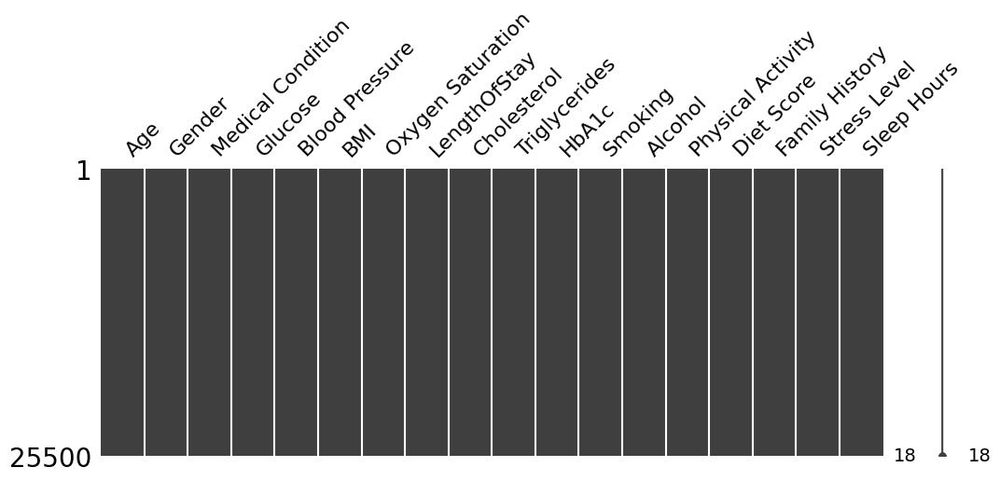

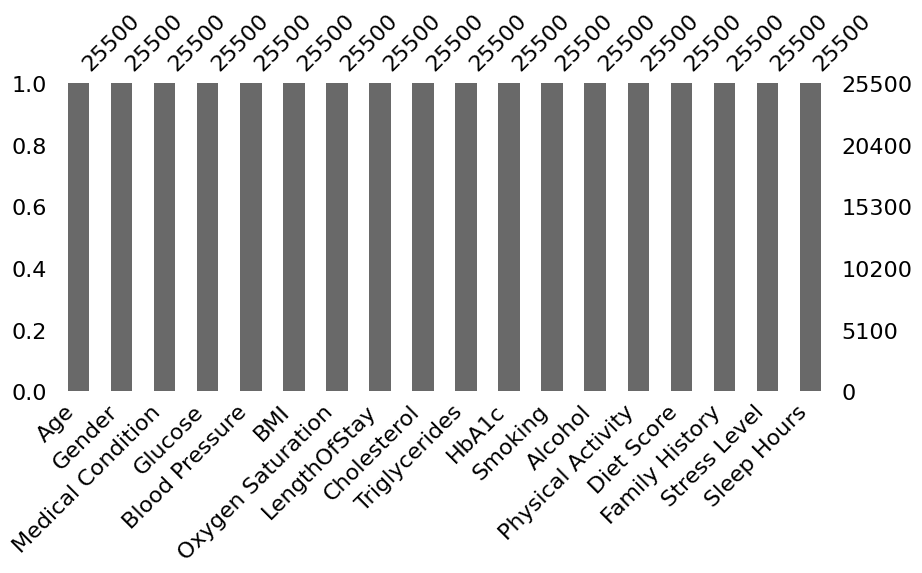

In [9]:

# 1. Сколько строк имеют хотя бы один пропуск?
rows_with_missing = df_clean.isnull().any(axis=1).sum()
print(f"Строк с пропусками: {rows_with_missing} из 25500")

# 2. Реальная доля пропусков по столбцам (абсолютные числа)
print("\nАбсолютное количество пропусков по столбцам:")
print(df_clean.isnull().sum().sort_values(ascending=False).head(10))

# 3) доля пропусков по столбцам
missing_per_col = df_clean.isnull().mean().sort_values(ascending=False)
print("Доля пропусков по столбца")
print(missing_per_col.head(20))

# 4) доля строк с хотя бы одним пропуском
rows_with_missing = (df_clean.isnull().any(axis=1)).mean()
print("Доля строк с пропусками:", rows_with_missing)

# 5) визуализация: matrix + bar
msno.matrix(df_clean, figsize=(12,4))
plt.show()
msno.bar(df_clean, figsize=(10,4))
plt.show()
pass

In [10]:
df_clean.head()
df_clean.info()


<class 'pandas.core.frame.DataFrame'>
Index: 25500 entries, 0 to 29999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                25500 non-null  float64
 1   Gender             25500 non-null  object 
 2   Medical Condition  25500 non-null  object 
 3   Glucose            25500 non-null  float64
 4   Blood Pressure     25500 non-null  float64
 5   BMI                25500 non-null  float64
 6   Oxygen Saturation  25500 non-null  float64
 7   LengthOfStay       25500 non-null  int64  
 8   Cholesterol        25500 non-null  float64
 9   Triglycerides      25500 non-null  float64
 10  HbA1c              25500 non-null  float64
 11  Smoking            25500 non-null  int64  
 12  Alcohol            25500 non-null  int64  
 13  Physical Activity  25500 non-null  float64
 14  Diet Score         25500 non-null  float64
 15  Family History     25500 non-null  int64  
 16  Stress Level       25500 no

Теперь все пропущенные значения обработаны и можно переходить к разведочному анализу данных.

### Разведочный анализ данных EDA:

#### Вычисление основных характеристик (среднее, разброс, корреляционная матрица и тд): 

Визуализация и описательная статистика - важные этапы анализа данных. 

Сводную информацию о признаках можем получить, вызвав метод describe:

In [11]:
df_clean.describe() 

,Age,Glucose,Blood Pressure,BMI,Oxygen Saturation,LengthOfStay,Cholesterol,Triglycerides,HbA1c,Smoking,Alcohol,Physical Activity,Diet Score,Family History,Stress Level,Sleep Hours
count,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.00000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000,25500.000000
mean,54.695686,123.553828,140.454265,28.474939,94.950878,4.40549,213.072891,176.939321,6.292121,0.279059,0.239490,3.850480,4.049707,0.436824,5.935929,6.231123
std,15.056952,39.928566,19.996876,5.727344,3.742507,2.74404,33.616404,48.746641,1.318946,0.448545,0.426781,1.961376,1.802786,0.496002,2.201394,1.188446
min,10.000000,20.320000,74.240000,7.670000,67.510000,1.00000,95.730000,1.140000,3.280000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.590000
25%,45.000000,97.665301,126.140000,24.590000,92.990000,3.00000,189.410000,141.437500,5.330000,0.000000,0.000000,2.417500,2.790000,0.000000,4.390000,5.420000
50%,56.000000,110.395000,139.053818,28.050000,95.300000,4.00000,211.760000,173.540000,5.970000,0.000000,0.000000,3.610000,3.800000,0.000000,5.900000,6.230000
75%,65.000000,136.132500,153.000000,31.830000,97.380000,5.00000,235.370000,208.422500,6.910000,1.000000,0.000000,5.080000,5.030000,1.000000,7.442500,7.050000
max,89.000000,318.510000,226.380000,56.850000,110.070000,19.00000,355.270000,421.510000,12.360000,1.000000,1.000000,12.410000,12.060000,1.000000,15.450000,10.350000


Для каждого количественного признака приведены средние значения, стандартное отклонение, минимальное и макимальное значения, медиана и значения квартилей.

По умолчанию этот метод дает информацию только о количественных признаках. Получим информацию о категориальных:

In [12]:
df_clean.describe(include=['object'])

,Gender,Medical Condition
count,25500,25500
unique,2,7
top,Female,Hypertension
freq,14725,7120


Построим диаграмму рассеивания для признаков 'BMI', 'Oxygen Saturation':

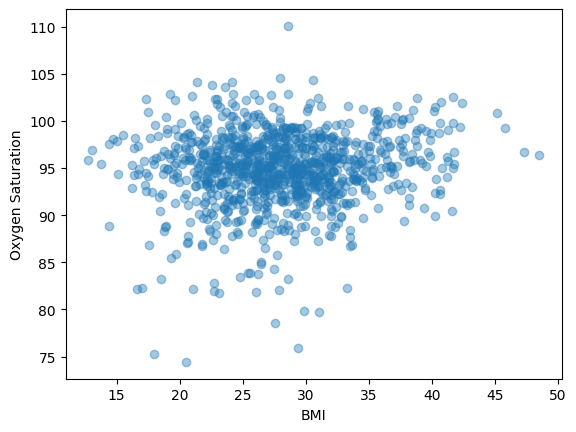

In [13]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(df_clean.shape[0]), size=1000, replace=False)
plt.scatter(df_clean.iloc[random_subset]['BMI'], df_clean.iloc[random_subset]['Oxygen Saturation'], alpha=0.4)
plt.xlabel('BMI')
plt.ylabel('Oxygen Saturation')
pass

Из рисунка понятно, что, по-видимому, никакой зависимости между BMI и Oxygen Saturation нет.

Построим диаграмму рассеивания для признаков 'HbA1c', 'Glucose':

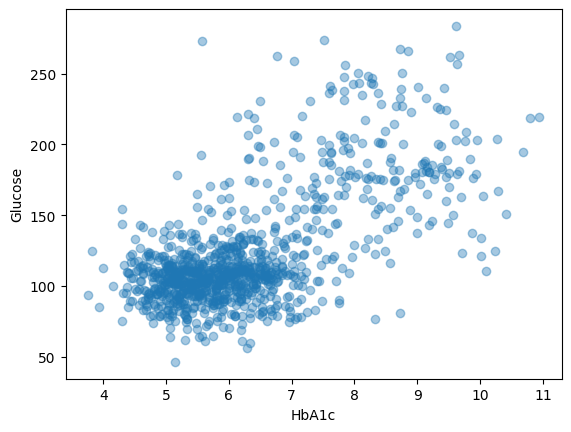

In [14]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(df_clean.shape[0]), size=1000, replace=False)
plt.scatter(df_clean.iloc[random_subset]['HbA1c'], df_clean.iloc[random_subset]['Glucose'], alpha=0.4)
plt.xlabel('HbA1c')
plt.ylabel('Glucose')
pass

Точки хоть и с большим разбросом но выстраиваются вдоль прямой идущей из нижнего левого угла в правый верхний: т.е. в некотором приближении мы можем наблюдать линейную зависимость между показателями Glucose и HBA1C.

Чем выше HbA1c (гликированный гемоглобин, отражает средний уровень глюкозы за 2-3 месяца), тем выше текущий уровень глюкозы.

Для отрисовки диаграммы рассеивания мы можем воспользоваться более продвинутой функцией scatterplot из модуля seaborn. Например, в следующей диаграмме цвет маркеров соответствует диагнозу пациента 'Medical Condition', а размер Physical Activity:

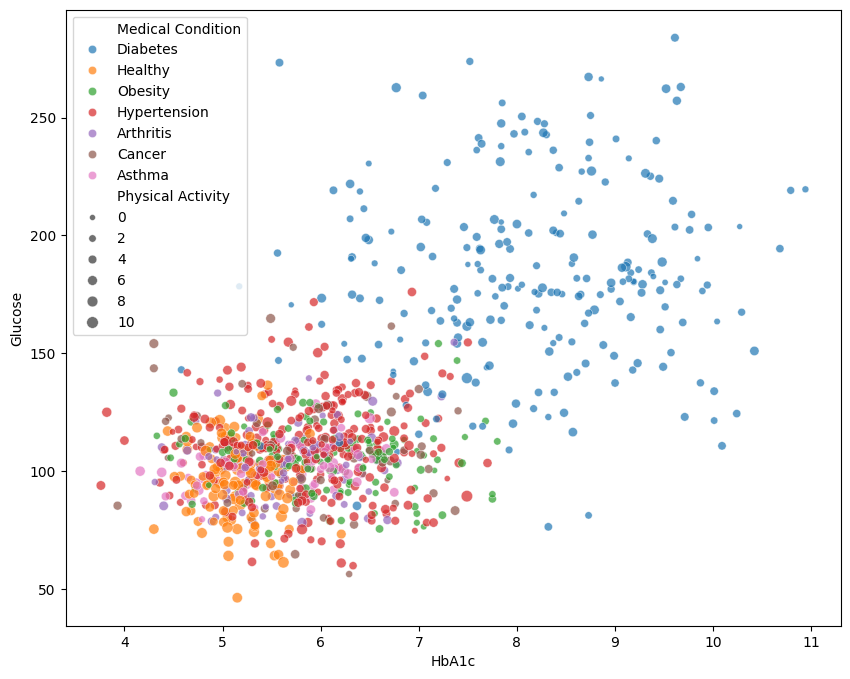

In [15]:
plt.figure(figsize = (10, 8))
sns.scatterplot(x='HbA1c', y='Glucose', size='Physical Activity', hue='Medical Condition', data=df_clean.iloc[random_subset], alpha=0.7)
pass

На расширенной диаграмме можно увидеть что большие большие точки (высокая физическая активность) концентрируются в зоне Healthy что логично, у здоровых пациентов с высокой активностью уровни глюкозы и HbA1c минимальны.

Маленькие точки (низкая активность) чаще встречаются в группах Diabetes и Obesity, то подтверждает связь малоподвижного образа жизни с метаболическими нарушениями.

Построим все возможные диаграммы рассеивания для каждой пары переменных:

C:\Users\Kiril\AppData\Local\Temp\ipykernel_15008\1887378169.py:2: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


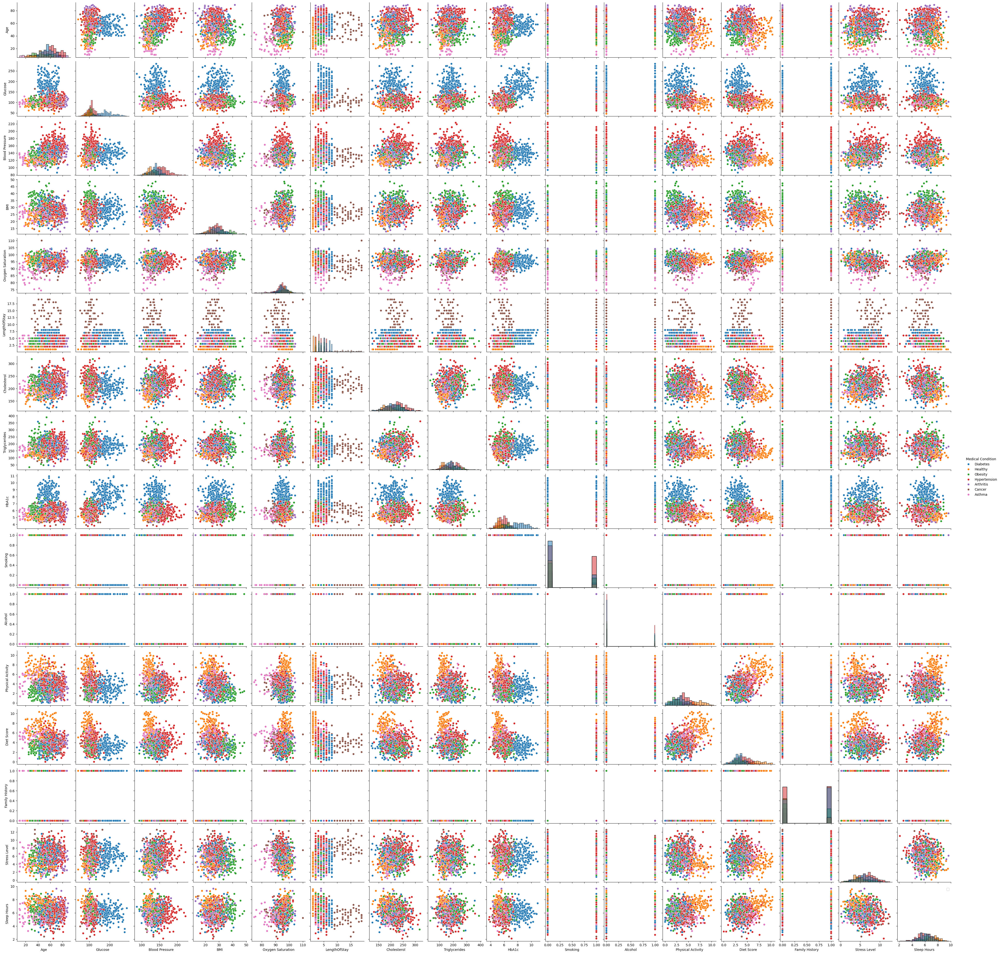

In [16]:
sns.pairplot(df_clean.iloc[random_subset], hue='Medical Condition', diag_kind='hist')
plt.legend()
pass

На большинстве диаграмм можно наблюдать отсутвие каких либо зависимостей между переменными

Подтвердим это построив матрицу корреляции для количественных признаков

In [17]:
numerical_data = df_clean.select_dtypes(include=['float64'])
numerical_data['LengthOfStay'] = df_clean['LengthOfStay']
corr_mat = numerical_data.corr()
corr_mat

,Age,Glucose,Blood Pressure,BMI,Oxygen Saturation,Cholesterol,Triglycerides,HbA1c,Physical Activity,Diet Score,Stress Level,Sleep Hours,LengthOfStay
Age,1.000000,0.127637,0.370668,-0.006906,0.085036,0.183993,0.114481,0.104562,-0.136683,-0.177629,0.179340,-0.088064,0.114628
Glucose,0.127637,1.000000,0.064386,0.078010,0.000225,0.008522,0.069058,0.638489,-0.235158,-0.318339,0.072073,-0.127772,0.237917
Blood Pressure,0.370668,0.064386,1.000000,0.076837,0.012526,0.274680,0.192991,0.051105,-0.153023,-0.206596,0.241536,-0.155334,0.042828
BMI,-0.006906,0.078010,0.076837,1.000000,0.062100,0.126410,0.185257,0.127995,-0.344584,-0.299956,-0.009626,-0.023638,0.002958
Oxygen Saturation,0.085036,0.000225,0.012526,0.062100,1.000000,-0.024648,-0.009125,-0.006818,-0.016965,0.029100,-0.105027,0.169837,-0.148159
Cholesterol,0.183993,0.008522,0.274680,0.126410,-0.024648,1.000000,0.179382,0.023936,-0.209366,-0.221795,0.166033,-0.137577,0.101136
Triglycerides,0.114481,0.069058,0.192991,0.185257,-0.009125,0.179382,1.000000,0.091173,-0.260442,-0.257335,0.103202,-0.114179,0.080875
HbA1c,0.104562,0.638489,0.051105,0.127995,-0.006818,0.023936,0.091173,1.000000,-0.277995,-0.344918,0.058728,-0.122934,0.245001
Physical Activity,-0.136683,-0.235158,-0.153023,-0.344584,-0.016965,-0.209366,-0.260442,-0.277995,1.000000,0.471016,-0.087721,0.147453,-0.183498
Diet Score,-0.177629,-0.318339,-0.206596,-0.299956,0.029100,-0.221795,-0.257335,-0.344918,0.471016,1.000000,-0.139241,0.197179,-0.243232


Удобно использовать визуальный образ этой матрицы. Чем светлее ячейка, тем больше по абсолютной величине коэффициент корреляции:

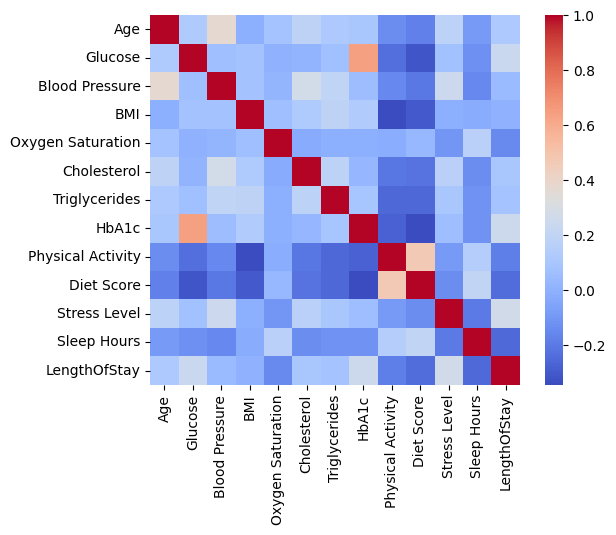

In [18]:
sns.heatmap(corr_mat, square=True, cmap='coolwarm')
pass

Выведем коэффициенты корреляции, большие заданного значения:

In [19]:
corr_mat > 0.5

,Age,Glucose,Blood Pressure,BMI,Oxygen Saturation,Cholesterol,Triglycerides,HbA1c,Physical Activity,Diet Score,Stress Level,Sleep Hours,LengthOfStay
Age,True,False,False,False,False,False,False,False,False,False,False,False,False
Glucose,False,True,False,False,False,False,False,True,False,False,False,False,False
Blood Pressure,False,False,True,False,False,False,False,False,False,False,False,False,False
BMI,False,False,False,True,False,False,False,False,False,False,False,False,False
Oxygen Saturation,False,False,False,False,True,False,False,False,False,False,False,False,False
Cholesterol,False,False,False,False,False,True,False,False,False,False,False,False,False
Triglycerides,False,False,False,False,False,False,True,False,False,False,False,False,False
HbA1c,False,True,False,False,False,False,False,True,False,False,False,False,False
Physical Activity,False,False,False,False,False,False,False,False,True,False,False,False,False
Diet Score,False,False,False,False,False,False,False,False,False,True,False,False,False


In [20]:
corr_mat < -0.5

,Age,Glucose,Blood Pressure,BMI,Oxygen Saturation,Cholesterol,Triglycerides,HbA1c,Physical Activity,Diet Score,Stress Level,Sleep Hours,LengthOfStay
Age,False,False,False,False,False,False,False,False,False,False,False,False,False
Glucose,False,False,False,False,False,False,False,False,False,False,False,False,False
Blood Pressure,False,False,False,False,False,False,False,False,False,False,False,False,False
BMI,False,False,False,False,False,False,False,False,False,False,False,False,False
Oxygen Saturation,False,False,False,False,False,False,False,False,False,False,False,False,False
Cholesterol,False,False,False,False,False,False,False,False,False,False,False,False,False
Triglycerides,False,False,False,False,False,False,False,False,False,False,False,False,False
HbA1c,False,False,False,False,False,False,False,False,False,False,False,False,False
Physical Activity,False,False,False,False,False,False,False,False,False,False,False,False,False
Diet Score,False,False,False,False,False,False,False,False,False,False,False,False,False


In [21]:
corr_mat.where(np.triu(corr_mat > 0.5, k=1)).stack().sort_values(ascending=False)

Glucose  HbA1c    0.638489
dtype: float64

In [22]:
corr_mat.where(np.triu(corr_mat < -0.5, k=1)).stack().sort_values(ascending=False)

Series([], dtype: float64)

### Проверка данных на наличие выбросов:

In [23]:
def dataset_outlier_summary(df, numerical_cols=None):
    
    if numerical_cols is None:
        numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    
    total_outliers = 0
    total_cells = len(df) * len(numerical_cols)
    features_with_outliers = 0
    outlier_details = {}
    
    for col in numerical_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_count = len(outliers)
        outlier_percentage = (outlier_count / len(df)) * 100
        
        total_outliers += outlier_count
        if outlier_count > 0:
            features_with_outliers += 1
        
        outlier_details[col] = {
            'outliers': outlier_count,
            'percentage': outlier_percentage,
            'bounds': (lower_bound, upper_bound)
        }
    
    # Общая статистика
    total_outlier_percentage = (total_outliers / total_cells) * 100
    
    print(f" ОБЩАЯ СТАТИСТИКА:")
    print(f"• Всего числовых признаков: {len(numerical_cols)}")
    print(f"• Всего строк в датасете: {len(df)}")
    print(f"• Всего числовых ячеек: {total_cells:,}")
    print(f"• Всего выбросов: {total_outliers:,}")
    print(f"• Процент выбросов: {total_outlier_percentage:.2f}%")
    print(f"• Признаков с выбросами: {features_with_outliers}/{len(numerical_cols)}")
    
    return total_outliers, total_outlier_percentage, outlier_details

# Запускаем анализ
total_outliers, total_percentage, details = dataset_outlier_summary(df_clean)

 ОБЩАЯ СТАТИСТИКА:
• Всего числовых признаков: 16
• Всего строк в датасете: 25500
• Всего числовых ячеек: 408,000
• Всего выбросов: 13,171
• Процент выбросов: 3.23%
• Признаков с выбросами: 14/16


Процент выбросов небольшой, оставлю как есть

### Обработка категориальных признаков:

Разделим признаки на категориальные и количественные:

In [24]:
categorical_columns = df_clean.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_columns   = df_clean.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(categorical_columns)
print(numerical_columns)



['Gender', 'Medical Condition']
['Age', 'Glucose', 'Blood Pressure', 'BMI', 'Oxygen Saturation', 'LengthOfStay', 'Cholesterol', 'Triglycerides', 'HbA1c', 'Smoking', 'Alcohol', 'Physical Activity', 'Diet Score', 'Family History', 'Stress Level', 'Sleep Hours']


Заметим что бинарные признаки Alcohol,Smoking,Family History уже закодированы и обрабатывать их не нужно.

In [25]:
for c in categorical_columns:
    print(c, df_clean[c].unique())

Gender ['Male' 'Female']
Medical Condition ['Diabetes' 'Healthy' 'Asthma' 'Obesity' 'Hypertension' 'Cancer'
 'Arthritis']


Разделим наши категориальные признаки на бинарные и небинарные:

In [26]:
binary_columns = [c for c in categorical_columns if df_clean[c].nunique() == 2]
nonbinary_columns = [c for c in categorical_columns if df_clean[c].nunique() > 2]
print(binary_columns, nonbinary_columns)

['Gender'] ['Medical Condition']


Обработаем единственный бинарный признак Gender:

In [27]:
df_clean['Gender'].unique()

array(['Male', 'Female'], dtype=object)

In [28]:
df_clean.loc[df_clean['Gender'] == 'Male', 'Gender'] = 0
df_clean.loc[df_clean['Gender'] == 'Female', 'Gender'] = 1
df_clean['Gender'] = df_clean['Gender'].astype(int)
df_clean['Gender'].describe()

count    25500.000000
mean         0.577451
std          0.493975
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: Gender, dtype: float64

Добавляю целевую переменную Is_Diabetes и удаляю столбец "Medical Condition" чтобы избежать data_leakage

In [29]:
df_clean["Is_Diabetes"] = (df_clean["Medical Condition"] == "Diabetes").astype(int)

# 3. Удаление Medical Condition из признаков (предотвращаем data leakage!)
df_clean = df_clean.drop(columns=["Medical Condition"])

Проверим баланс в Is_Diabetes

In [30]:
# Проверяем баланс
diabetes_count = df_clean["Is_Diabetes"].sum()
total_count = len(df_clean)
other_count = total_count - diabetes_count

print(f"Пациенты с другим диагнозом: {other_count} ({other_count/total_count:.1%})")
print(f"Пациенты с диабетом: {diabetes_count} ({diabetes_count/total_count:.1%})")
print(f"Соотношение: {other_count/diabetes_count:.1f}:1")

Пациенты с другим диагнозом: 19083 (74.8%)
Пациенты с диабетом: 6417 (25.2%)
Соотношение: 3.0:1


Наблюдаются явные проблемы с балансировкой. 

Думаю модели RandomForest, GradientBoosting, ExtraTrees должны справиться c этой проблемой.

Также я не планирую удалять коррелирующие признаки из датасета, потому что выбранные мной модели инвариантны к мультиколлинеарности.

### Нормализация количественных признаков:

Нормализация количественных признаков не применяется, поскольку основные модели для решения задачи — RandomForest, GradientBoosting и ExtraTrees — инвариантны к масштабу признаков. Эти алгоритмы основаны на деревьях решений, которые используют пороговые значения для разделения данных, а не расстояния между наблюдениями. Сохранение исходных единиц измерения (мг/дл для глюкозы, мм рт.ст. для давления) критически важно для клинической интерпретируемости результатов, что соответствует требованиям медицинских диагностических систем.

#### Подготовка X и y:

In [31]:
feature_cols = [
    "Age", "Glucose", "BMI", "Oxygen Saturation", "LengthOfStay",
    "Cholesterol", "Triglycerides", "HbA1c", "Physical Activity","Blood Pressure",
    "Diet Score", "Stress Level", "Sleep Hours", "Gender", "Smoking", "Alcohol", "Family History"
]

X = df_clean[feature_cols]
y = df_clean["Is_Diabetes"]

print(f"Размер X: {X.shape}")
print(f"Тип данных X: {type(X)}")


Размер X: (25500, 17)
Тип данных X: <class 'pandas.core.frame.DataFrame'>


### Разбиение на обучающую и тестовую выборки для моделей:

In [32]:
from sklearn.model_selection import train_test_split

# Подготовка данных 
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y
)

# Расчет весов для балансировки
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

#### Обучение RandomForestClassifier:

In [33]:
# === Random Forest Classifier ===
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Обучение модели
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    class_weight={0: 1, 1: scale_pos_weight},
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)

# Предсказания
y_train_pred_rf = rf_model.predict(X_train)
y_test_pred_rf = rf_model.predict(X_test)

# Метрики качества
print("=== Random Forest Classifier ===")
print("\nМетрики качества:")
print(f"Train Accuracy:  {accuracy_score(y_train, y_train_pred_rf):.4f}")
print(f"Train Precision: {precision_score(y_train, y_train_pred_rf):.4f}")
print(f"Train Recall:    {recall_score(y_train, y_train_pred_rf):.4f}")
print(f"Train F1-score:  {f1_score(y_train, y_train_pred_rf):.4f}")
print(f"Test Accuracy:   {accuracy_score(y_test, y_test_pred_rf):.4f}")
print(f"Test Precision:  {precision_score(y_test, y_test_pred_rf):.4f}")
print(f"Test Recall:     {recall_score(y_test, y_test_pred_rf):.4f}")
print(f"Test F1-score:   {f1_score(y_test, y_test_pred_rf):.4f}")

# Анализ ошибок
cm_rf = confusion_matrix(y_test, y_test_pred_rf)
tn, fp, fn, tp = cm_rf.ravel()
print("\nОшибки на тестовой выборке:")
print(f"Ложно-положительные (FP): {fp} - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом")
print(f"Ложно-отрицательные (FN): {fn} - больные диабетом, помеченные как не имеющие диабета")
print(f"Всего ошибок: {fp + fn} из {len(y_test)}")
print(f"Процент ошибок: {(fp + fn) / len(y_test) * 100:.2f}%")


=== Random Forest Classifier ===

Метрики качества:
Train Accuracy:  0.9848
Train Precision: 0.9680
Train Recall:    0.9718
Train F1-score:  0.9699
Test Accuracy:   0.9786
Test Precision:  0.9615
Test Recall:     0.9532
Test F1-score:   0.9573

Ошибки на тестовой выборке:
Ложно-положительные (FP): 49 - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом
Ложно-отрицательные (FN): 60 - больные диабетом, помеченные как не имеющие диабета
Всего ошибок: 109 из 5100
Процент ошибок: 2.14%


#### Обучение Gradient Boosting Classifier:

In [34]:
# === Gradient Boosting Classifier ===
from sklearn.ensemble import GradientBoostingClassifier

# Обучение модели
gbc_model = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    random_state=42
)
gbc_model.fit(X_train, y_train)

# Предсказания
y_train_pred_gbc = gbc_model.predict(X_train)
y_test_pred_gbc = gbc_model.predict(X_test)

# Метрики качества
print("=== Gradient Boosting Classifier ===")
print("\nМетрики качества:")
print(f"Train Accuracy:  {accuracy_score(y_train, y_train_pred_gbc):.4f}")
print(f"Train Precision: {precision_score(y_train, y_train_pred_gbc):.4f}")
print(f"Train Recall:    {recall_score(y_train, y_train_pred_gbc):.4f}")
print(f"Train F1-score:  {f1_score(y_train, y_train_pred_gbc):.4f}")
print(f"Test Accuracy:   {accuracy_score(y_test, y_test_pred_gbc):.4f}")
print(f"Test Precision:  {precision_score(y_test, y_test_pred_gbc):.4f}")
print(f"Test Recall:     {recall_score(y_test, y_test_pred_gbc):.4f}")
print(f"Test F1-score:   {f1_score(y_test, y_test_pred_gbc):.4f}")

# Анализ ошибок
cm_gbc = confusion_matrix(y_test, y_test_pred_gbc)
tn, fp, fn, tp = cm_gbc.ravel()
print("\nОшибки на тестовой выборке:")
print(f"Ложно-положительные (FP): {fp} - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом")
print(f"Ложно-отрицательные (FN): {fn} - больные диабетом, помеченные как не имеющие диабета")
print(f"Всего ошибок: {fp + fn} из {len(y_test)}")
print(f"Процент ошибок: {(fp + fn) / len(y_test) * 100:.2f}%")

=== Gradient Boosting Classifier ===

Метрики качества:
Train Accuracy:  0.9885
Train Precision: 0.9873
Train Recall:    0.9667
Train F1-score:  0.9769
Test Accuracy:   0.9796
Test Precision:  0.9712
Test Recall:     0.9470
Test F1-score:   0.9590

Ошибки на тестовой выборке:
Ложно-положительные (FP): 36 - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом
Ложно-отрицательные (FN): 68 - больные диабетом, помеченные как не имеющие диабета
Всего ошибок: 104 из 5100
Процент ошибок: 2.04%


#### Обучение Extra Trees Classifier:

In [35]:
# === Extra Trees Classifier ===
from sklearn.ensemble import ExtraTreesClassifier

# Обучение модели
etc_model = ExtraTreesClassifier(
    n_estimators=100,
    max_depth=10,
    class_weight={0: 1, 1: scale_pos_weight},
    random_state=42,
    n_jobs=-1
)
etc_model.fit(X_train, y_train)

# Предсказания
y_train_pred_etc = etc_model.predict(X_train)
y_test_pred_etc = etc_model.predict(X_test)

# Метрики качества
print("=== Extra Trees Classifier ===")
print("\nМетрики качества:")
print(f"Train Accuracy:  {accuracy_score(y_train, y_train_pred_etc):.4f}")
print(f"Train Precision: {precision_score(y_train, y_train_pred_etc):.4f}")
print(f"Train Recall:    {recall_score(y_train, y_train_pred_etc):.4f}")
print(f"Train F1-score:  {f1_score(y_train, y_train_pred_etc):.4f}")
print(f"Test Accuracy:   {accuracy_score(y_test, y_test_pred_etc):.4f}")
print(f"Test Precision:  {precision_score(y_test, y_test_pred_etc):.4f}")
print(f"Test Recall:     {recall_score(y_test, y_test_pred_etc):.4f}")
print(f"Test F1-score:   {f1_score(y_test, y_test_pred_etc):.4f}")

# Анализ ошибок
cm_etc = confusion_matrix(y_test, y_test_pred_etc)
tn, fp, fn, tp = cm_etc.ravel()
print("\nОшибки на тестовой выборке:")
print(f"Ложно-положительные (FP): {fp} - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом")
print(f"Ложно-отрицательные (FN): {fn} - больные диабетом, помеченные как не имеющие диабета")
print(f"Всего ошибок: {fp + fn} из {len(y_test)}")
print(f"Процент ошибок: {(fp + fn) / len(y_test) * 100:.2f}%")

=== Extra Trees Classifier ===

Метрики качества:
Train Accuracy:  0.9794
Train Precision: 0.9594
Train Recall:    0.9585
Train F1-score:  0.9590
Test Accuracy:   0.9765
Test Precision:  0.9554
Test Recall:     0.9509
Test F1-score:   0.9531

Ошибки на тестовой выборке:
Ложно-положительные (FP): 57 - люди без диабета (здоровые или с другими диагнозами), помеченные как больные диабетом
Ложно-отрицательные (FN): 63 - больные диабетом, помеченные как не имеющие диабета
Всего ошибок: 120 из 5100
Процент ошибок: 2.35%


### Выбор лучшей модели

1. Сравнены три алгоритма:
   - **RandomForest**
   - **GradientBoosting**
   - **ExtraTrees**

2. Лучшая модель — **RandomForestClassifier**, показавшая следующие метрики:
   - **Recall:** 95.32% (эффективность выявления пациентов с диабетом)
   - **Пропущено больных:** всего **60** из 5100 пациентов
   - **Минимальное переобучение:** разница между Train и Test = **1.86%**


В диагностике диабета каждый пропущенный больной критичен. Random Forest минимизирует этот риск лучше всех

### Общие выводы:

В ходе анализа успешно решена задача классификации диабета на синтетическом медицинском датасете.

#### Основные результаты:

- Проведена обработка пропущенных значений в четырёх ключевых признаках с помощью **IterativeImputer**.
- Исправлены аномальные значения (включая отрицательные показатели).
- Сохранено **25 500 строк из 30 000**, что позволило избежать существенной потери данных.
- Проведен разведочный анализ данных с визуализацией.
- Проблема несбалансированности классов решена **без удаления данных** — с помощью подбора и сравнения моделей.
- Было обучено три модели и выбрана наилучшая.
